In [1]:
# @title Import required packages
import torch
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from google.colab import drive
import os

import numpy as np
import random
from PIL import Image
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt

import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet18

import time
import torch.optim as optim

import warnings
warnings.filterwarnings('ignore', category=UserWarning)

# Set random seed
seed = 1234
torch.manual_seed(seed)
np.random.seed(seed)

In [2]:
drive.flush_and_unmount()
drive.mount("/content/gdrive",force_remount=True)

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/gdrive


In [3]:
os.chdir("/content/gdrive/MyDrive/UIUC/assignment5_ec/")

In [ ]:
# @title Download imagenette
# import requests, tarfile, os

# fname = 'imagenette2-320'
# url = 'https://osf.io/mnve4/download'

# if not os.path.exists(fname):
#   print("Data is being downloaded...")
#   r = requests.get(url, stream=True)
#   with open(fname+'tgz', 'wb') as fd:
#     fd.write(r.content)

#   with tarfile.open(fname+'tgz', "r") as ft:
#     ft.extractall()

#   os.remove(fname+'tgz')
#   print("The download has been completed.")
# else:
#   print("Data has already been downloaded.")

In [4]:
# @title Data Setup
class Imagenette():

    def __init__(self, root, train, download, transform) -> None:
        super().__init__() #root=root, train=train, download=download, transform=transform)
        self.root = root
        self.train = train
        self.transform = transform
        self.download = download

        if self.train:
            self.data_dir = os.path.join(self.root, "train")
        else:
            self.data_dir = os.path.join(self.root, "val")

        self.image_list = []
        self.label_list = []

        # read image files and labels
        for label, label_name in enumerate(sorted(os.listdir(self.data_dir))):
            label_dir = os.path.join(self.data_dir, label_name)
            if not os.path.isdir(label_dir):
              continue  # skip non-directo
            for file_name in os.listdir(label_dir):
                self.image_list.append(os.path.join(label_dir, file_name))
                self.label_list.append(label)
                
    def __len__(self):
        return len(self.image_list)
    
    def __getitem__(self, index: int):
        #image, cls_label = super().__getitem__(index)
        
        image_path = self.image_list[index]
        label = self.label_list[index]
        image = Image.open(image_path).convert("RGB")
        #image = Image.array(pil_image) # 
        image = self.transform(image)
       
        return image, torch.tensor(label).long()

In [5]:
# @title Train and Test Data Loader
transform_train = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    
])

transform_test = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])


In [6]:
batch_size = 128

trainset = Imagenette(root='imagenette2-320/', train=True,
                                        download=False, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=1)

testset = Imagenette(root='imagenette2-320/', train=False,
                                       download=False, transform=transform_test)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False, num_workers=1)

Show some example images 

In [7]:
classes = ('n01440764','n02102040','n02979186','n03000684','n03028079','n03394916','n03417042','n03425413','n03445777','n03888257')
classes_name = ('Tench',
                'English springer',
                'Cassette player',
                'Chainsaw',
                'Church',
                'Horn',
                'Garbage truck',
                'Gas pump', 
                'Golf ball',
                'Parachute',
                )

In [ ]:
def imshow(img):
    npimg = img.numpy() #converts the image tensor to a NumPy array 
    plt.imshow(np.transpose(npimg, (1, 2, 0)))  #transposes the dimensions so that the image is in the format (height, width, channels) instead of the PyTorch format (channels, height, width)
    plt.show()

dataiter = iter(trainloader)
images, labels = next(dataiter)

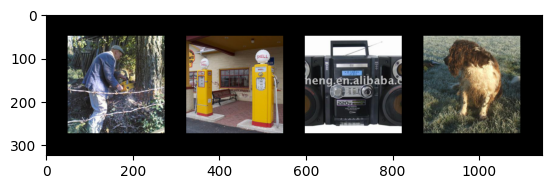

Class labels:  Chainsaw Gas pump Cassette player English springer


In [ ]:
# print images and label of images
img_grid = imshow(torchvision.utils.make_grid(images[:4], padding=50))
print('Class labels: ', ' '.join(f'{classes_name[labels[j]]:5s}' for j in range(4)))

### Training ResNet18 model on Imagenette Data 

Used Pre-trained ResNet18 model and fine-tune on the imagenette data classification task. Freeze all previous layers except for the last 'fc' layer.

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
# Initialize the network
net = resnet18(pretrained=True)
num_features = net.fc.in_features
net.fc = nn.Linear(num_features, 10)

# Define the device (GPU or CPU) to use
net.to(device)

# Freeze all previous layers; only keep the 'fc' layer trainable
for param in net.parameters():
    param.requires_grad = False

# Unfreeze the 'fc' layer
for param in net.fc.parameters():
    param.requires_grad = True

# Print all the trainable parameters
params_to_update = net.parameters()
print("Params to learn:")
params_to_update = []
for name,param in net.named_parameters():
    if param.requires_grad == True:
        params_to_update.append(param)
        print("\t",name)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 271MB/s]


Params to learn:
	 fc.weight
	 fc.bias


### Evaluation code

In [ ]:
def adjust_learning_rate(optimizer, epoch, init_lr, decay_epochs=5):
    """Sets the learning rate to the initial LR decayed by 10 every 5 epochs"""
    lr = init_lr * (0.1 ** (epoch // decay_epochs))
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

In [ ]:
def run_test(net, testloader, criterion):
    correct = 0
    total = 0
    avg_test_loss = 0.0
    with torch.no_grad():
        for images, cls_labels in testloader:
            images, labels = images.to(device), cls_labels.to(device)
            outputs=net(images)
            _,predicted=torch.max(outputs.data,1)
            total+=labels.size(0)
            correct+=(predicted==labels).sum().item()
            # loss
            avg_test_loss += criterion(outputs, labels)  / len(testloader)
    print('TESTING:')
    print(f'Accuracy of the network on the 10000 test images: {100 * correct / total:.2f} %')
    print(f'Average loss on the 10000 test images: {avg_test_loss:.3f}')

In [ ]:
def train(net, criterion, optimizer, num_epochs, decay_epochs, init_lr):

    for epoch in range(num_epochs):  

        running_loss = 0.0
        running_correct = 0.0
        running_total = 0.0
        start_time = time.time()

        net.train()

        for i, (imgs, cls_label) in enumerate(trainloader, 0):
            adjust_learning_rate(optimizer, epoch, init_lr, decay_epochs)
            imgs=imgs.to(device)  
            labels=cls_label.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs=net(imgs)
            loss=criterion(outputs,labels)
            loss.backward()
            optimizer.step()

            # Get predicted results
            _,predicted = torch.max(outputs.data,1)

            # print statistics
            print_freq = 1
            running_loss += loss.item()

            # calc acc
            running_total += labels.size(0)
            running_correct += (predicted == labels).sum().item()

            if i % print_freq == (print_freq - 1):    # print every 2000 mini-batches
                print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_freq:.3f} acc: {100*running_correct / running_total:.2f} time: {time.time() - start_time:.2f}')
                running_loss, running_correct, running_total = 0.0, 0.0, 0.0
                start_time = time.time()

        # TODO: Run the run_test() function after each epoch; Set the model to the evaluation mode.
        net.eval()
        run_test(net,testloader,criterion)
    print('Finished Training')

In [ ]:
criterion = None
optimizer = None
criterion=nn.CrossEntropyLoss()
optimizer=optim.Adam(net.parameters(),lr=0.001)

In [ ]:
train(net, criterion, optimizer, num_epochs=10, decay_epochs=5, init_lr=0.001)

[1,     1] loss: 1.751 acc: 48.44 time: 55.60
[1,     2] loss: 1.636 acc: 61.72 time: 43.03
[1,     3] loss: 1.617 acc: 59.38 time: 47.65
[1,     4] loss: 1.426 acc: 75.78 time: 42.86
[1,     5] loss: 1.323 acc: 80.47 time: 45.51
[1,     6] loss: 1.211 acc: 89.06 time: 42.37
[1,     7] loss: 1.189 acc: 84.38 time: 43.05
[1,     8] loss: 1.149 acc: 83.59 time: 43.84
[1,     9] loss: 1.033 acc: 92.19 time: 41.98
[1,    10] loss: 1.009 acc: 86.72 time: 47.80
[1,    11] loss: 0.903 acc: 94.53 time: 44.12
[1,    12] loss: 0.787 acc: 95.31 time: 46.03
[1,    13] loss: 0.783 acc: 93.75 time: 51.24
[1,    14] loss: 0.699 acc: 96.09 time: 46.30
[1,    15] loss: 0.681 acc: 96.88 time: 44.35
[1,    16] loss: 0.635 acc: 96.09 time: 46.37
[1,    17] loss: 0.652 acc: 94.53 time: 44.66
[1,    18] loss: 0.527 acc: 96.09 time: 44.50
[1,    19] loss: 0.583 acc: 93.75 time: 48.14
[1,    20] loss: 0.499 acc: 96.88 time: 46.23
[1,    21] loss: 0.495 acc: 94.53 time: 43.02
[1,    22] loss: 0.509 acc: 95.31 

In [ ]:
# @title Save model
torch.save(net.state_dict(), 'imagenette_model_4.pth')

In [9]:
# @title Load model 
pretrained_model = "imagenette_model_4.pth"

# Initialize the network
model = resnet18(num_classes=10)

# Load the pretrained model
model.load_state_dict(torch.load(pretrained_model, map_location='cpu'))

model = model.to(device)

# Set the model in evaluation mode
model = model.eval()

In [10]:
# @title Load Test Data
# Create the generator
g = torch.Generator()
g.manual_seed(42)

batch_size = 1
testset = Imagenette(root='imagenette2-320/', train=False,
                                       download=False, transform=transform_test)
test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=True, num_workers=0,generator=g)

# # Load the test dataset
# testset = Imagenette(root='imagenette2-320/', train=False,
#                      download=False, transform=transform_test)

# # Use SubsetRandomSampler to randomly sample from the test dataset
# import torch.utils.data as data

# sample_testset = torch.utils.data.Subset(testset, range(1000, 1200))
# test_loader = data.DataLoader(sample_testset, batch_size=1,
#                               num_workers=0, generator=g)

In [11]:
# @title Fast Gradient Sign Method 
def fgsm_attack(image, epsilon, device, data_grad):
    image = image.clone().detach().to(device)
    perturbed_image = image + epsilon * data_grad.sign()
    if epsilon == 0: 
      return image
    else: 
      ## Clip image to maintain the range [0,1]
      perturbed_image = torch.clamp(perturbed_image, 0,1)
      return perturbed_image

In [12]:
def fgsm_attack_test(model, test_loader, epsilon, device, num_display=5):
    num_correct = 0
    adv_examples = []
    
    for image, label in test_loader:
        image = image.to(device)
        label = label.to(device)
        image.requires_grad = True
       
        output = model(image)
        _, init_pred = output.max(dim=1)
       
        if init_pred[0].item() != label[0].item():
            continue

        loss = F.nll_loss(output, label).to(device)
        model.zero_grad()
        loss.backward()

        data_grad = image.grad.data
        eps = epsilon/255.0
        perturbed_image = fgsm_attack(image, eps, device, data_grad)
        perturbed_output = model(perturbed_image)
        _, perturbed_pred = perturbed_output.max(dim=1)
       
        if perturbed_pred[0].item() == label[0].item():
          num_correct += 1
          if(epsilon == 0) and (len(adv_examples) < 5):
            adv_ex = perturbed_image.squeeze().detach().cpu().numpy()
            adv_examples.append( (init_pred[0].item(), perturbed_pred[0].item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
            if len(adv_examples) < 5:
                adv_ex = perturbed_image.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred[0].item(), perturbed_pred[0].item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = num_correct/float(len(test_loader))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, num_correct, len(test_loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

In [13]:
num_display = 5
fgsm_accuracies = []
fgsm_all_adv_examples = []
epsilons = [0,2,4,8,16,32]

for epsilon in epsilons:
    accuracy, adv_examples = fgsm_attack_test(model, test_loader, epsilon, device, num_display)
    fgsm_accuracies.append(accuracy)
    fgsm_all_adv_examples.append(adv_examples)

Epsilon: 0	Test Accuracy = 3852 / 3911 = 0.9849143441575045
Epsilon: 2	Test Accuracy = 1208 / 3911 = 0.308872411148044
Epsilon: 4	Test Accuracy = 888 / 3911 = 0.22705190488366148
Epsilon: 8	Test Accuracy = 973 / 3911 = 0.24878547686013808
Epsilon: 16	Test Accuracy = 1178 / 3911 = 0.3012017386857581
Epsilon: 32	Test Accuracy = 1197 / 3911 = 0.3060598312452058


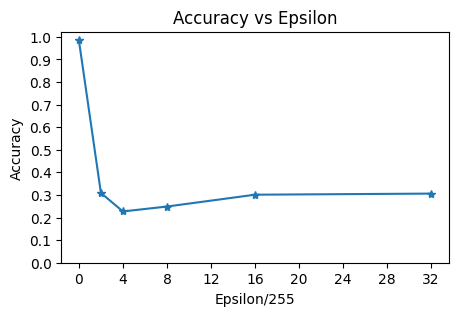

In [17]:
# @title Plot Accuracy Vs Epsilon
plt.figure(figsize=(5,3))
plt.plot(epsilons, fgsm_accuracies, "*-")
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xticks(np.arange(0, 36, step=4))
plt.title("Accuracy vs Epsilon")
plt.xlabel("Epsilon/255")
plt.ylabel("Accuracy")
plt.show()

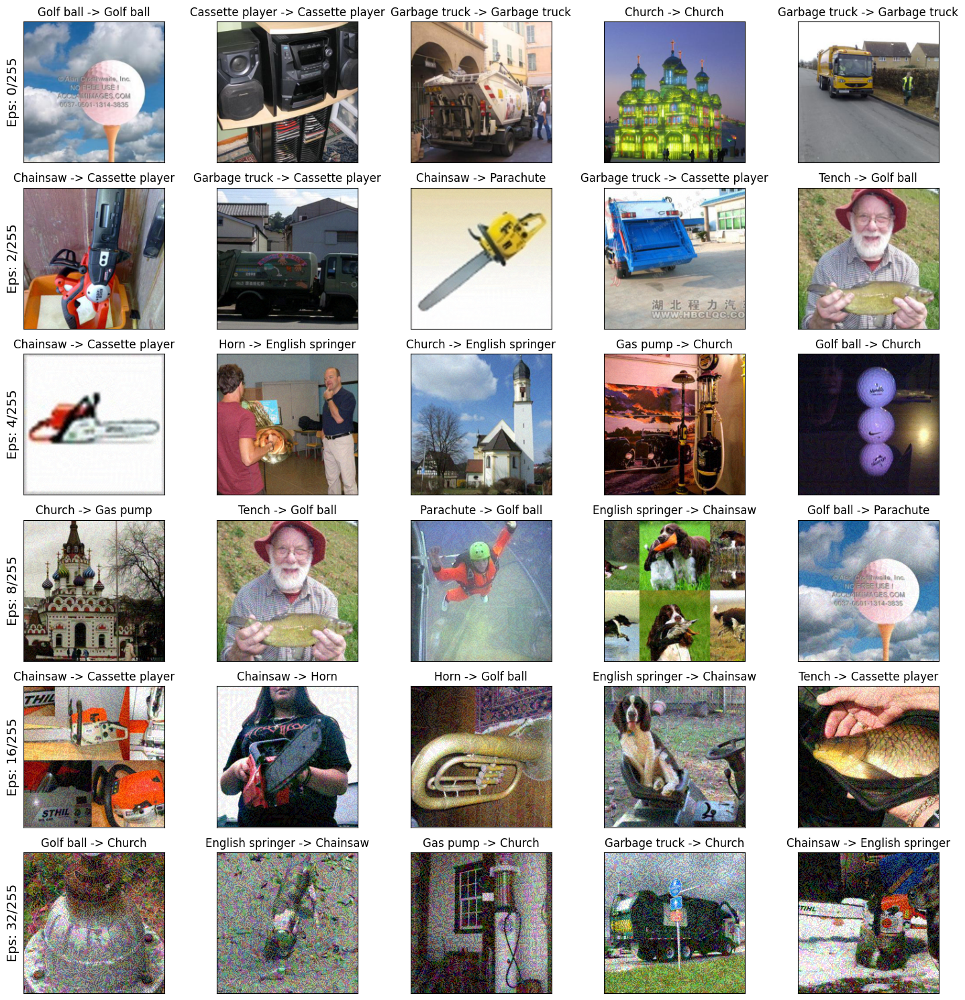

In [18]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(15,15))
for i in range(len(epsilons)):
    for j in range(len(fgsm_all_adv_examples[i])):
        cnt += 1
        plt.subplot(len(epsilons),len(fgsm_all_adv_examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}/255".format(epsilons[i]), fontsize=14)
        orig,adv,ex = fgsm_all_adv_examples[i][j]
        ex = torch.Tensor(ex)
        plt.title("{} -> {}".format(classes_name[orig], classes_name[adv]))
        plt.imshow(np.transpose(ex, (1, 2, 0)))
plt.tight_layout()
plt.show()

In [19]:
# @title Iterative Gradient Sign Method (IGSM) attack 
def basic_iterative_attack(model, image, label, eps) :
    image = image.clone().detach().to(device)
    label = label.clone().detach().to(device)  
    ori_images = image.clone().detach()
  
    alpha = 0.1/255.0 #default

    # As per paper min(eps + 4, 1.25*eps) is used as iterations
    if eps == 0.0: 
      iters = 0
    else:
      iters = int(min(eps + 4, 1.25*eps, 10))
    
    # In the original paper the images were in [0,255] range but here our data is in [0,1].
    # So we need to scale the epsilon value in a way that suits our data, which is dividing by 255.
    eps = eps/255.0
    
    for i in range(iters) :    
        image.requires_grad = True
        output = model(image)
        pred_label = output.max(dim=1)[1]
            
        if pred_label[0].item() != label[0].item():
          break

        model.zero_grad()
        loss = F.nll_loss(output, label)
        loss.backward()
        data_grad = image.grad.data
        grad = data_grad.sign()
        attack_images = image + alpha*grad.sign()
        a = torch.clamp(ori_images - eps, min=0)
        b = (attack_images >= a).float()*attack_images + (attack_images < a).float()*a 
        c = (b > ori_images+eps).float()*(ori_images+eps) + (ori_images+eps >= b).float()*b
        image = torch.clamp(c, max = 1).detach()
    return image

In [20]:
def bim_test(model, test_loader, epsilon, device, num_display=5):
    
    num_correct = 0
    adv_examples = []

    for image, label in test_loader:
        image = image.to(device)
        label = label.to(device)
        image.requires_grad = True

        output = model(image)
        _, init_pred = output.max(dim=1)

        if init_pred[0].item() != label[0].item():
            continue

        perturbed_image = basic_iterative_attack(model, image, label, epsilon) 
        perturbed_output = model(perturbed_image)
        _, perturbed_pred = perturbed_output.max(dim=1)
       
        if perturbed_pred[0].item() == label[0].item():
          num_correct += 1
          if (epsilon == 0) and (len(adv_examples) < 5):
            adv_ex = perturbed_image.squeeze().detach().cpu().numpy()
            adv_examples.append( (init_pred[0].item(), perturbed_pred[0].item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
          if len(adv_examples) < 5:
            adv_ex = perturbed_image.squeeze().detach().cpu().numpy()
            adv_examples.append( (init_pred[0].item(), perturbed_pred[0].item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = num_correct/float(len(test_loader))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, num_correct, len(test_loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

In [21]:
num_display = 5
bim_accuracies = []
bim_all_adv_examples = []
epsilons = [0,2,4,8,16,32] #[0, .05, .1, .15, .2, .25, .3]

for epsilon in epsilons:
    accuracy, adv_examples = bim_test(model, test_loader, epsilon, device, num_display)
    bim_accuracies.append(accuracy)
    bim_all_adv_examples.append(adv_examples)

Epsilon: 0	Test Accuracy = 3852 / 3911 = 0.9849143441575045
Epsilon: 2	Test Accuracy = 3543 / 3911 = 0.9059064177959602
Epsilon: 4	Test Accuracy = 2336 / 3911 = 0.5972896957299924
Epsilon: 8	Test Accuracy = 757 / 3911 = 0.19355663513167987
Epsilon: 16	Test Accuracy = 514 / 3911 = 0.13142418818716442
Epsilon: 32	Test Accuracy = 514 / 3911 = 0.13142418818716442


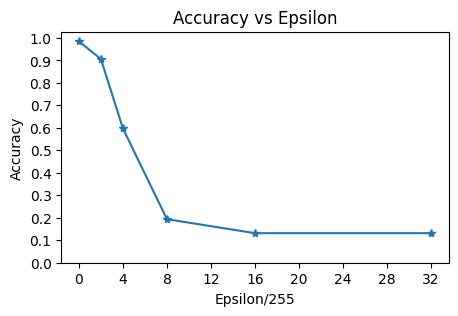

In [22]:
# @title Plot Accuracy Vs Epsilon
plt.figure(figsize=(5,3))
plt.plot(epsilons, bim_accuracies, "*-")
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xticks(np.arange(0, 36, step=4))
plt.title("Accuracy vs Epsilon")
plt.xlabel("Epsilon/255")
plt.ylabel("Accuracy")
plt.show()

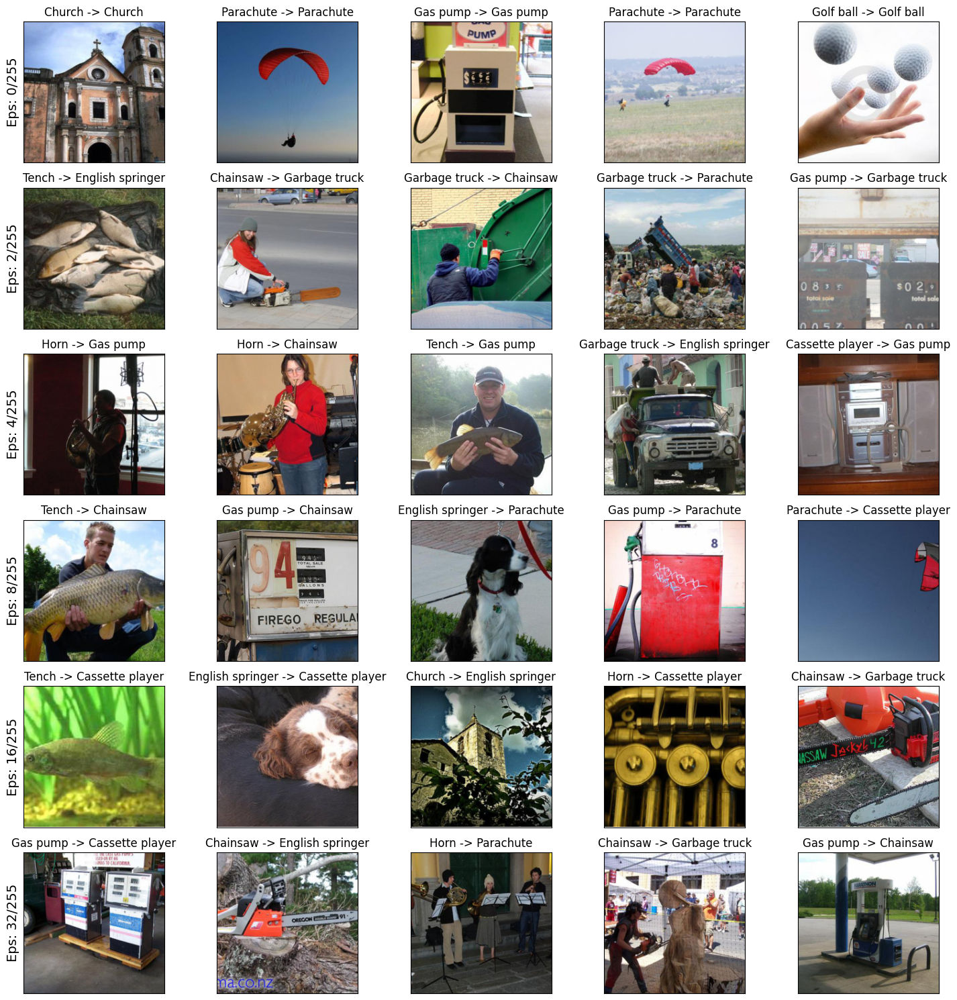

In [23]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(15,15))
for i in range(len(epsilons)):
    for j in range(len(bim_all_adv_examples[i])):
        cnt += 1
        plt.subplot(len(epsilons),len(bim_all_adv_examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}/255".format(epsilons[i]), fontsize=14)
        orig,adv,ex = bim_all_adv_examples[i][j]
        ex = torch.Tensor(ex)
        plt.title("{} -> {}".format(classes_name[orig], classes_name[adv]))
        plt.imshow(np.transpose(ex, (1, 2, 0)))
plt.tight_layout()
plt.show()

In [30]:
# @title Least Likely Class Methods
def least_likely_class(model, image, label, eps):
    image = image.clone().detach().to(device)
    label = label.clone().detach().to(device) 
    ori_images = image.clone().detach()
 
    alpha = 1/255.0 #default
    if eps == 0.0: 
      iters = 0
    else:
      iters = int(min(eps + 4, 1.25*eps, 10))
    # In the original paper the images were in [0,255] range but here our data is in [0,1].
    # So we need to scale the epsilon value in a way that suits our data, which is dividing by 255.
    eps = eps/255.0

    output = model(image)
    ll_label = torch.min(output,1)[1] # get the index of the min log-probability  
    
    for i in range(iters) :    
        image.requires_grad = True
        output = model(image)
        _, init_pred = output.max(dim=1)
        
        # If the current prediction is already wrong, dont bother to continue
        if init_pred[0].item() != label[0].item():
            return image

        loss = F.nll_loss(output, ll_label)
        # Zero all existing gradients
        model.zero_grad()
        loss.backward()
        data_grad = image.grad.data
        grad = data_grad.sign()
        
        attack_images = image - alpha*grad.sign()
        a = torch.clamp(ori_images - eps, min=0)
        b = (attack_images >= a).float()*attack_images + (attack_images < a).float()*a 
        c = (b > ori_images+eps).float()*(ori_images+eps) + (ori_images+eps >= b).float()*b
        image = torch.clamp(c, max = 1).detach()
           
    return image

In [31]:
def least_likely_class_test(model, test_loader, epsilon, device, num_display=5):
    
    num_correct = 0
    adv_examples = []
    
    for image, label in test_loader:
        image = image.to(device)
        label = label.to(device)
        image.requires_grad = True

        output = model(image)
        _, init_pred = output.max(dim=1)

        if init_pred[0].item() != label[0].item():
            continue

        perturbed_image = least_likely_class(model, image, label, epsilon)
        perturbed_output = model(perturbed_image)
        _, perturbed_pred = perturbed_output.max(dim=1)
       
        if perturbed_pred[0].item() == label[0].item():
          num_correct += 1
         
          if (epsilon == 0) and (len(adv_examples) < 5):
                  adv_ex = perturbed_image.squeeze().detach().cpu().numpy()
                  adv_examples.append( (init_pred[0].item(), perturbed_pred[0].item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
          if len(adv_examples) < 5:
            adv_ex = perturbed_image.squeeze().detach().cpu().numpy()
            adv_examples.append( (init_pred[0].item(), perturbed_pred[0].item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = num_correct/float(len(test_loader))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, num_correct, len(test_loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

In [32]:
num_display = 5
least_likely_class_accuracies = []
least_likely_class_all_adv_examples = []
epsilons = [0, 2, 4, 8, 16, 32]

for epsilon in epsilons:
    accuracy, adv_examples = least_likely_class_test(model, test_loader, epsilon, device, num_display)
    least_likely_class_accuracies.append(accuracy)
    least_likely_class_all_adv_examples.append(adv_examples)

Epsilon: 0	Test Accuracy = 3852 / 3911 = 0.9849143441575045
Epsilon: 2	Test Accuracy = 2061 / 3911 = 0.5269751981590386
Epsilon: 4	Test Accuracy = 57 / 3911 = 0.014574277678343135
Epsilon: 8	Test Accuracy = 0 / 3911 = 0.0
Epsilon: 16	Test Accuracy = 0 / 3911 = 0.0
Epsilon: 32	Test Accuracy = 0 / 3911 = 0.0


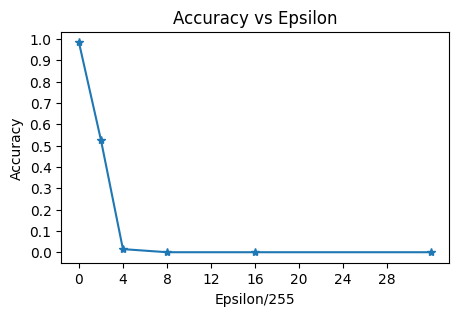

In [33]:
# @title Plot Accuracy Vs Epsilon
plt.figure(figsize=(5,3))
plt.plot(epsilons, least_likely_class_accuracies, "*-")
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xticks(np.arange(0, 32, step=4))
plt.title("Accuracy vs Epsilon")
plt.xlabel("Epsilon/255")
plt.ylabel("Accuracy")
plt.show()

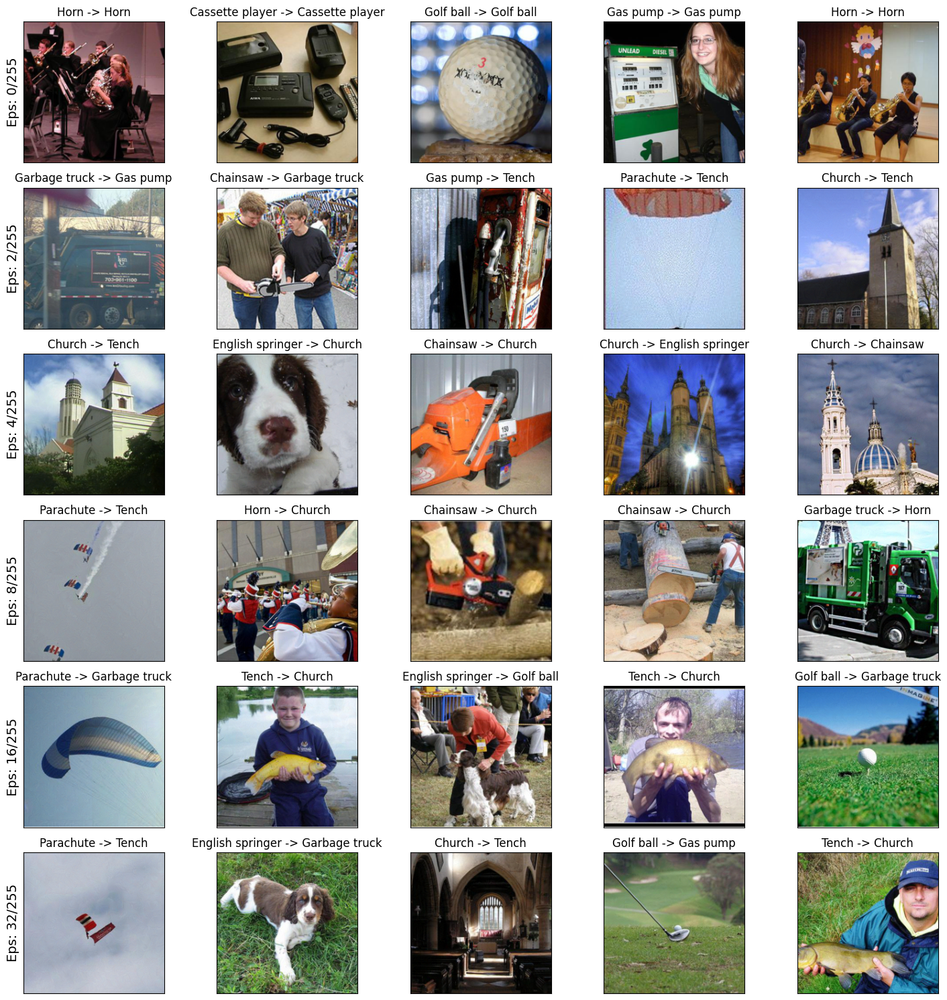

In [34]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(15,15))
for i in range(len(epsilons)):
    for j in range(len(least_likely_class_all_adv_examples[i])):
        cnt += 1
        plt.subplot(len(epsilons),len(least_likely_class_all_adv_examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}/255".format(epsilons[i]), fontsize=14)
        orig,adv,ex = least_likely_class_all_adv_examples[i][j]
        ex = torch.Tensor(ex)
        plt.title("{} -> {}".format(classes_name[orig], classes_name[adv]))
        plt.imshow(np.transpose(ex, (1, 2, 0)))
plt.tight_layout()
plt.show()

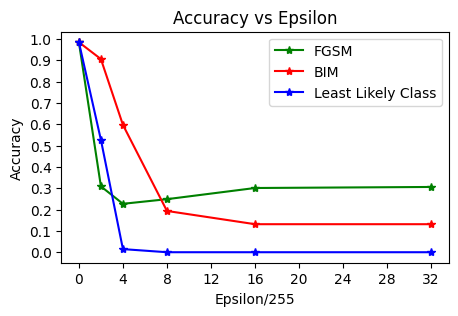

In [35]:
# @title Plot Accuracy Vs Epsilon for different Methods
plt.figure(figsize=(5,3))
plt.plot(epsilons, fgsm_accuracies, "*-", color='green', label='FGSM')
plt.plot(epsilons, bim_accuracies, "*-", color='red', label='BIM')
plt.plot(epsilons, least_likely_class_accuracies, "*-", color='blue', label='Least Likely Class')
plt.legend()
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xticks(np.arange(0, 36, step=4))
plt.title("Accuracy vs Epsilon")
plt.xlabel("Epsilon/255")
plt.ylabel("Accuracy")
plt.show()